# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цель исследования:**
* Найти особенности заведений общественного питания города Москвы.

**Исследование будет проходить в несколько шагов:**
* Шаг 1. Загрузите данные и изучите общую информацию;
* Шаг 2. Выполните предобработку данных;
* Шаг 3. Анализ данных;
* Шаг 4. Детализируем исследование: открытие кофейни;
* Шаг 5. Общий вывод.

In [1]:
# импортируем необходимы библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
pd.set_option('display.max_colwidth', 0)

## Загрузим данные и изучим общую информацию

In [2]:
data = pd.read_csv('C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data['name'].sort_values().nunique()

5614

In [6]:
data.groupby('name').agg({'address':'count'}).query('address > 1').count()

address    714
dtype: int64

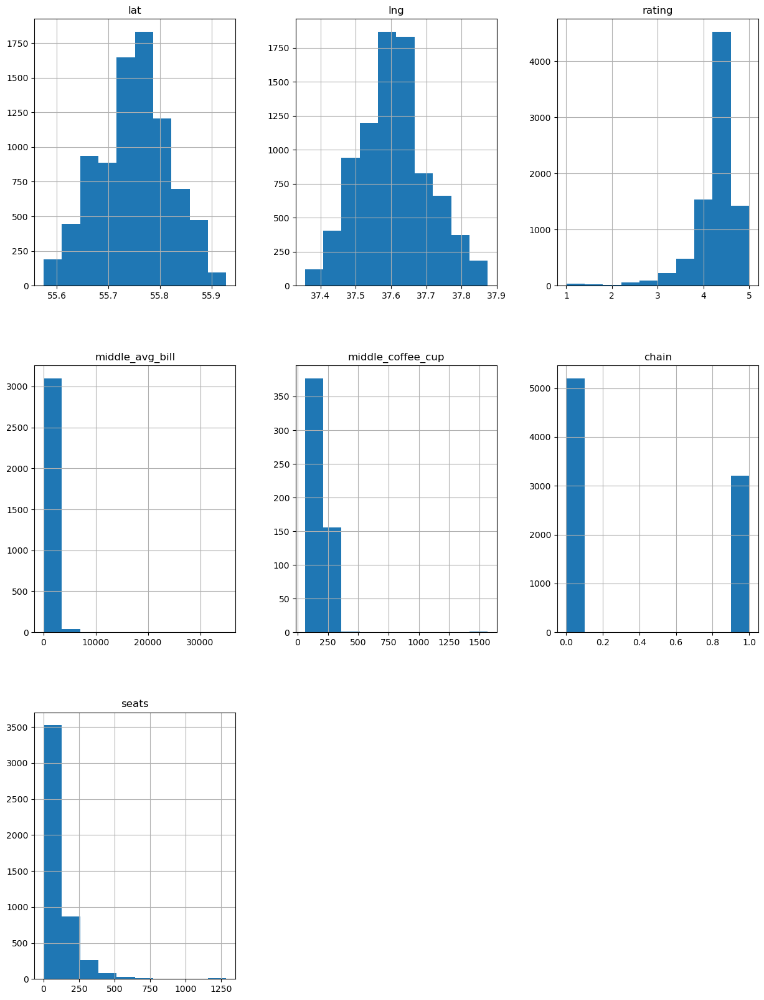

In [7]:
data.hist(figsize=(15, 20))
plt.show()

**Описание данных:**
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

**Вывод:**
* в датасете предоставленна информация о 8406 заведениях, из них 5614 с уникальными названиями, 714 с двумя и более заведениями;

## Выполним предобработку данных

In [8]:
display(data.duplicated().sum()) # Проверяем количество явных дубликатов
data.isna().sum() # Проверяем количество пропусков в каждом столбце

0

name                 0   
category             0   
address              0   
district             0   
hours                536 
lat                  0   
lng                  0   
rating               0   
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                0   
seats                3611
dtype: int64

In [9]:
# посмотрим на строки где нет пропусков в avg_bill и price
nans = data.loc[data['avg_bill'].notnull() & data['price'].notnull()][['price','avg_bill']]

In [10]:
for i in nans['price'].unique():
    display(nans.loc[nans['price'] == i].head())

,price,avg_bill
1,выше среднего,Средний счёт:1500–1600 ₽
14,выше среднего,Средний счёт:1500 ₽
68,выше среднего,Средний счёт:1000–1500 ₽
111,выше среднего,Средний счёт:600–2000 ₽
117,выше среднего,Средний счёт:300–2000 ₽


,price,avg_bill
2,средние,Средний счёт:от 1000 ₽
4,средние,Средний счёт:400–600 ₽
6,средние,Средний счёт:199 ₽
7,средние,Средний счёт:200–300 ₽
8,средние,Средний счёт:от 500 ₽


,price,avg_bill
69,высокие,Средний счёт:1500–2000 ₽
76,высокие,Средний счёт:2000–2500 ₽
93,высокие,Средний счёт:2100 ₽
264,высокие,Средний счёт:2000 ₽
292,высокие,Средний счёт:1500–3000 ₽


,price,avg_bill
100,низкие,Цена чашки капучино:150–210 ₽
105,низкие,Средний счёт:от 120 ₽
128,низкие,Средний счёт:150–300 ₽
173,низкие,Средний счёт:240 ₽
444,низкие,Цена чашки капучино:150–240 ₽


In [11]:
# приведем названия заведений к нижнему регистру, чтобы избежать задвоения 
data['name'] = [x.lower() for x in data['name']]

In [12]:
data.groupby('name').agg({'address':'count'}).query('address > 1').count()

address    752
dtype: int64

In [13]:
# добавим новый столбец street с названием улицы
data['street'] = data['address'].apply(lambda x: x.split(',')[1])

In [14]:
# добавим новый столбец is_24/7 с логическим значением True, если заведение работает ежедневно и круглосуточно, 
# False в противном случае
data['is_24/7'] = data['hours'].apply(lambda x: x == 'ежедневно, круглосуточно')

In [15]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Вывод:**

* В датасете отсутсвуют явные дубликаты, это радует;
* К сожалению есть большое количество пропусков, и не представляется возможным их удалить или заполнить. Хотели заполнить столбец price в соответствии со столбцом avg_bill, но видим что дельта среднего чека пересекается, следовательно заполнить категорию по среднему чеку будет не правильно - это исказит данные, например:

`выше среднего Средний счёт:1500–1600 ₽` и `высокие	Средний счёт:1500–2000 ₽`

* Пропуски в столбцах middle_avg_bill, middle_coffee_cup так же оставляем, т.к. они заполняются данными из avg_bill;
* Пропущенные значения в hours и seats не можем заполнить, т.к. каждое кафе работает по своему распорядку времени и даже внутри одной сети рабочие дни, часы работы и количество посадочных мест может разнится;
* Пропуски в данных появились т.к. данные взяты из общедоступных источников следовательно тут сыграл человеческий фактор, там где можно было не заполнять - не заполняли;
* Все наименования привели к нижнему регистру для минимизации дубликатов - это нам позволило выявить еще 38 сетевых заведений;
* Добавили два новых столбца street с названием улицы и is_24/7 с логическим значением True, если заведение работает ежедневно и круглосуточно и False в противном случае

## Анализ данных

### Посмотрим какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям и построим визуализации.

In [16]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [17]:
# Посмотроим какие категории заведений представлены в данных и как они распределены
categorys = data.groupby('category').agg({'name':'count'}).sort_values(by = 'name', ascending = False)
categorys

,name
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


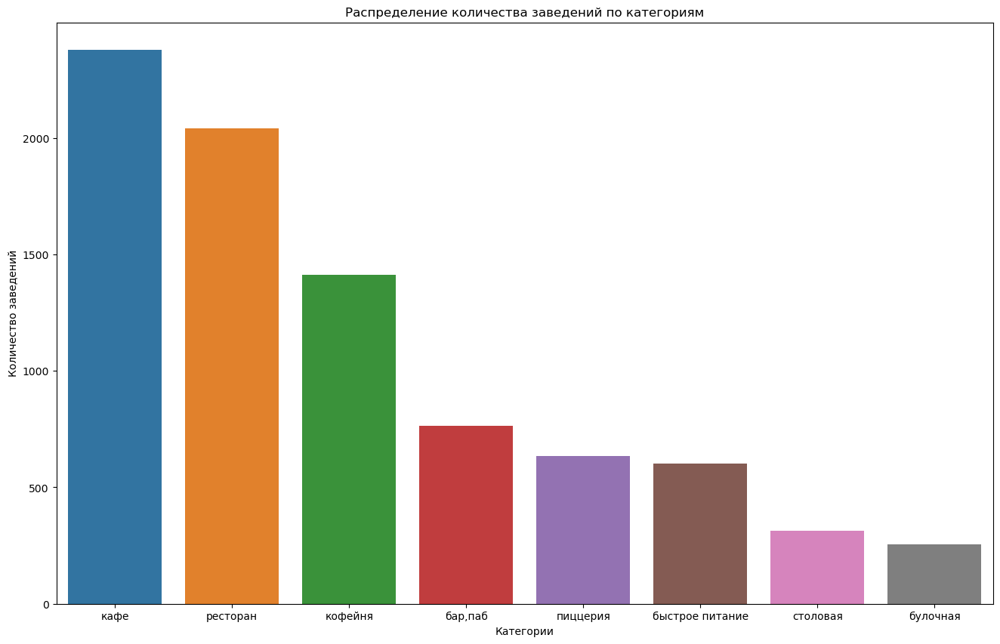

In [18]:
plt.figure(figsize=(16, 10))
sns.barplot(data = categorys, x = categorys.index, y = 'name')
plt.title('Распределение количества заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.show()

* В датасете представленны категории заведений: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая';
* По количеству заведений лидирует Кафе замыкает этот список Булочная;

### Исследуем количество посадочных мест по категориям и построим визуализации.

In [19]:
# Исследуем количество посадочных мест в местах по категориям
seats = data.groupby('category').agg({'seats':'median'}).sort_values(by = 'seats', ascending = False)
seats

,seats
category,
ресторан,86.0
"бар,паб",82.5
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


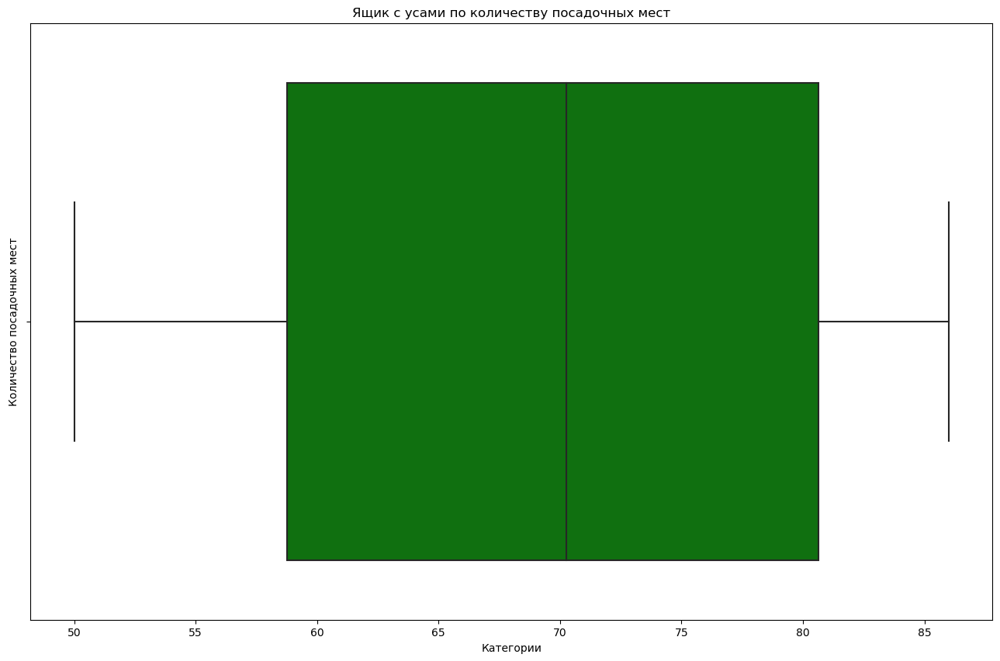

In [20]:
# Посмотрим имеются ли выбросы в количестве посадочных мест
plt.figure(figsize=(16, 10))
sns.boxplot(data = seats, x = 'seats', color = 'green')
plt.title('Ящик с усами по количеству посадочных мест')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.show()

In [21]:
data['name_chain'] = data['chain'].apply(lambda x: 'несетевые заведения' if x == 0 else 'сетевые заведения')

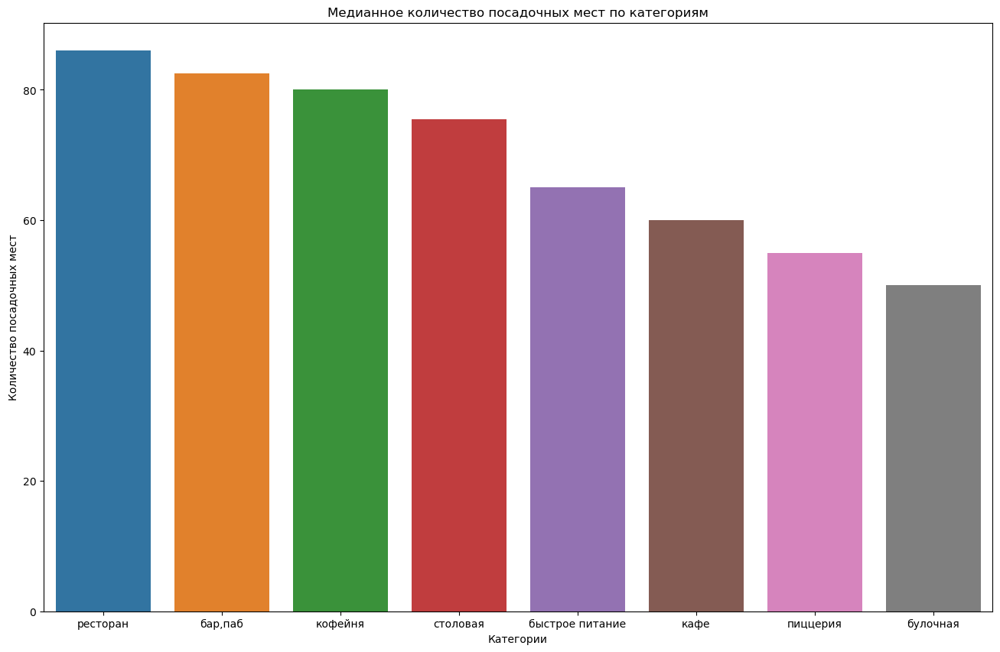

In [22]:
# Строим сравнение по медианному количеству посадочных мест
plt.figure(figsize=(16, 10))
sns.barplot(data = seats, x = seats.index, y = 'seats')
plt.title('Медианное количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.show()

* Самое большое количество посадочных мест в Ресторанах, а минимальное в Булочных;
* Медианное количество посадочных мест по категорям находится в диаппазоне от 50 до 85;

### Рассмотрим соотношение сетевых и несетевых заведений в датасете. 

In [23]:
chains = data.groupby('name_chain').agg({'name':'count'})
fig = go.Figure(data=[go.Pie(labels=chains.index, values=chains['name'], title = 'Несетевые заведения лидируют по количеству')])
fig.show() 

* Несетевые зведения лидируют по количеству;

### Рассмотрим какие категории заведений чаще являются сетевыми.

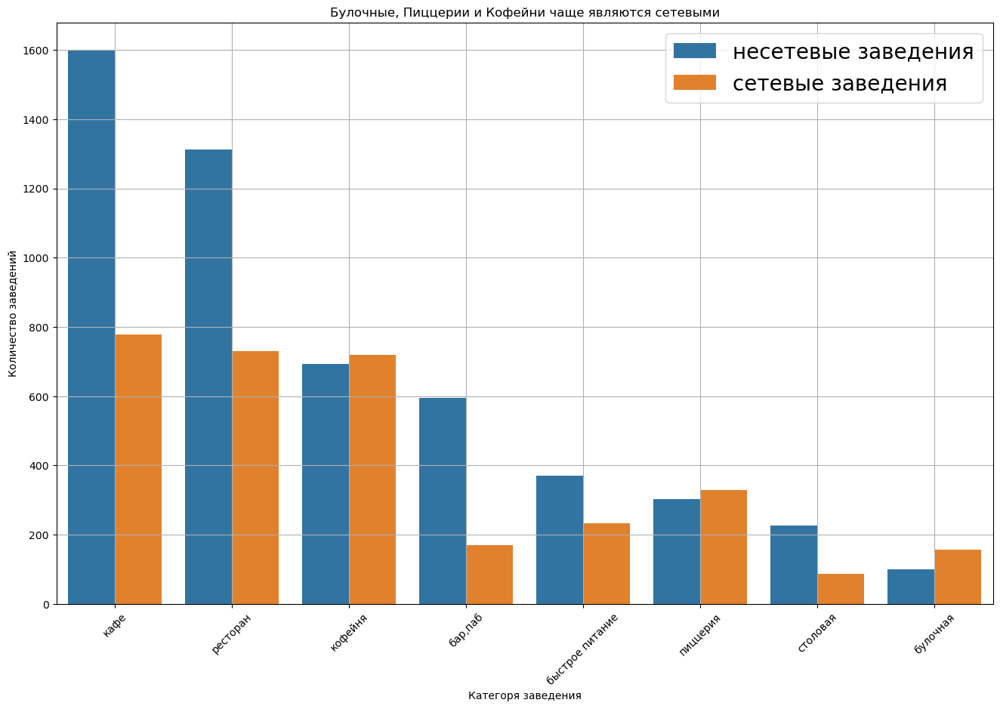

In [24]:
category_chain = data.groupby(['category','name_chain']).agg({'name':'count'})\
.reset_index().sort_values(by='name',ascending = False)
plt.figure(figsize=(16, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='name', data=category_chain, hue='name_chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Булочные, Пиццерии и Кофейни чаще являются сетевыми')
plt.xlabel('Категоря заведения')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=20)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

* Булочные, Пиццерии и Кофейни чаще являются сетевыми;

### Найдем топ-15 популярных сетей в Москве. 

In [25]:
# Найдем топ-15 популярных сетей в Москве
top_15 = data.groupby(['name','category','name_chain']).agg({'address':'count','rating':'mean'})\
.sort_values(by='address',ascending = False)\
.query('name_chain != "несетевые заведения"').head(15).reset_index().rename(columns = {'address':'count'})
top_15

,name,category,name_chain,count,rating
0,шоколадница,кофейня,сетевые заведения,119,4.178151
1,домино'с пицца,пиццерия,сетевые заведения,76,4.169737
2,додо пицца,пиццерия,сетевые заведения,74,4.286486
3,one price coffee,кофейня,сетевые заведения,71,4.064789
4,яндекс лавка,ресторан,сетевые заведения,69,3.872464
5,cofix,кофейня,сетевые заведения,65,4.075385
6,prime,ресторан,сетевые заведения,49,4.114286
7,кофепорт,кофейня,сетевые заведения,42,4.147619
8,кулинарная лавка братьев караваевых,кафе,сетевые заведения,39,4.394872
9,теремок,ресторан,сетевые заведения,36,4.105556


In [26]:
top_15['category'].unique()

array(['кофейня', 'пиццерия', 'ресторан', 'кафе', 'булочная'],
      dtype=object)

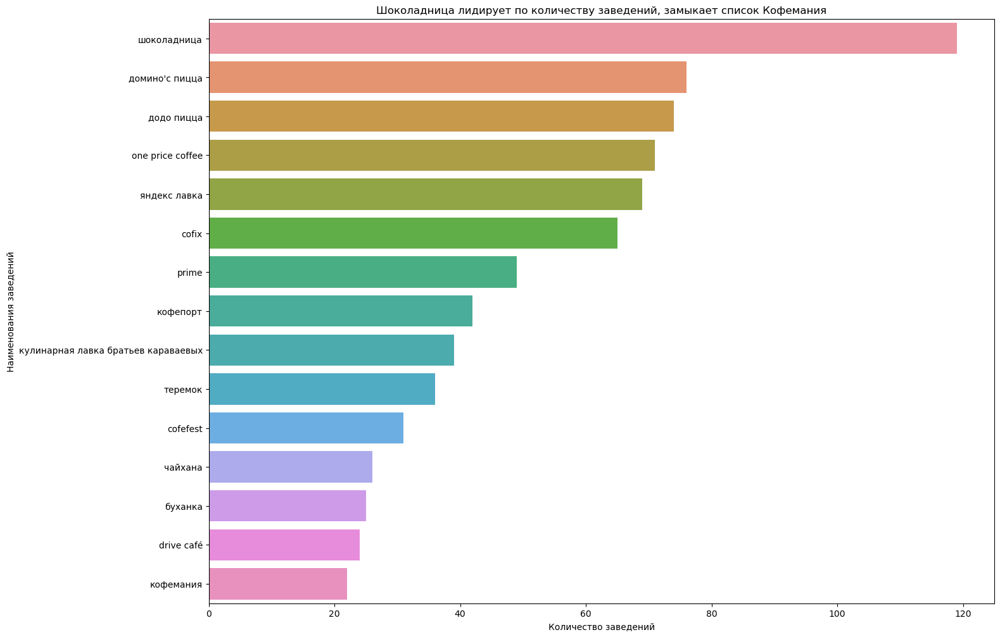

In [27]:
plt.figure(figsize=(16, 12))
# строим столбчатый график средствами seaborn
sns.barplot(x='count', y='name', data=top_15)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Шоколадница лидирует по количеству заведений, замыкает список Кофемания')
plt.xlabel('Количество заведений')
plt.ylabel('Наименования заведений')
# отображаем график на экране
plt.show()

 * В топ-15 заведений входят сети распространенные в России;
 * Средний рейтинг топ-15 заведений варьируется от 3.87 до 4.46;
 * В топ 15 заведений попали катогории: 'кофейня', 'пиццерия', 'ресторан', 'кафе', 'булочная';

### Посмотрим какие административные районы Москвы присутствуют в датасете.

In [28]:
print('Всего районов предоставленных в датасете', data['district'].nunique(),'их наименования:', data['district'].unique())

Всего районов предоставленных в датасете 9 их наименования: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


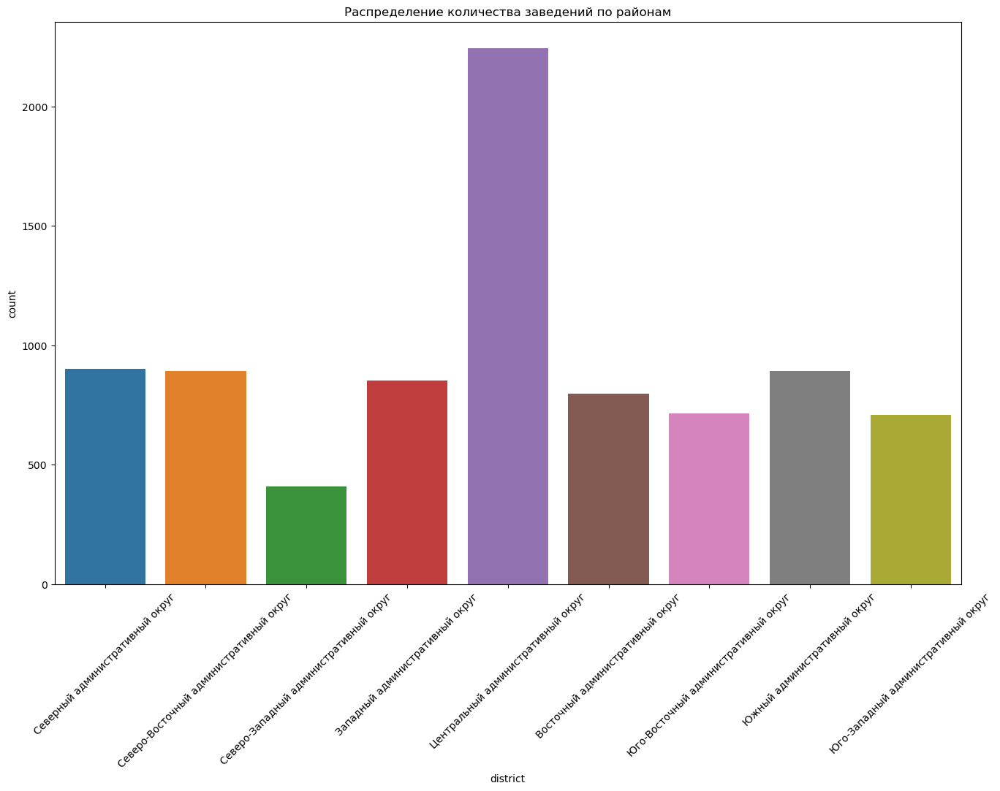

In [29]:
plt.figure(figsize=(16, 10))
sns.countplot(x='district', data=data)
plt.xticks(rotation=45)
plt.title('Распределение количества заведений по районам')
plt.show()

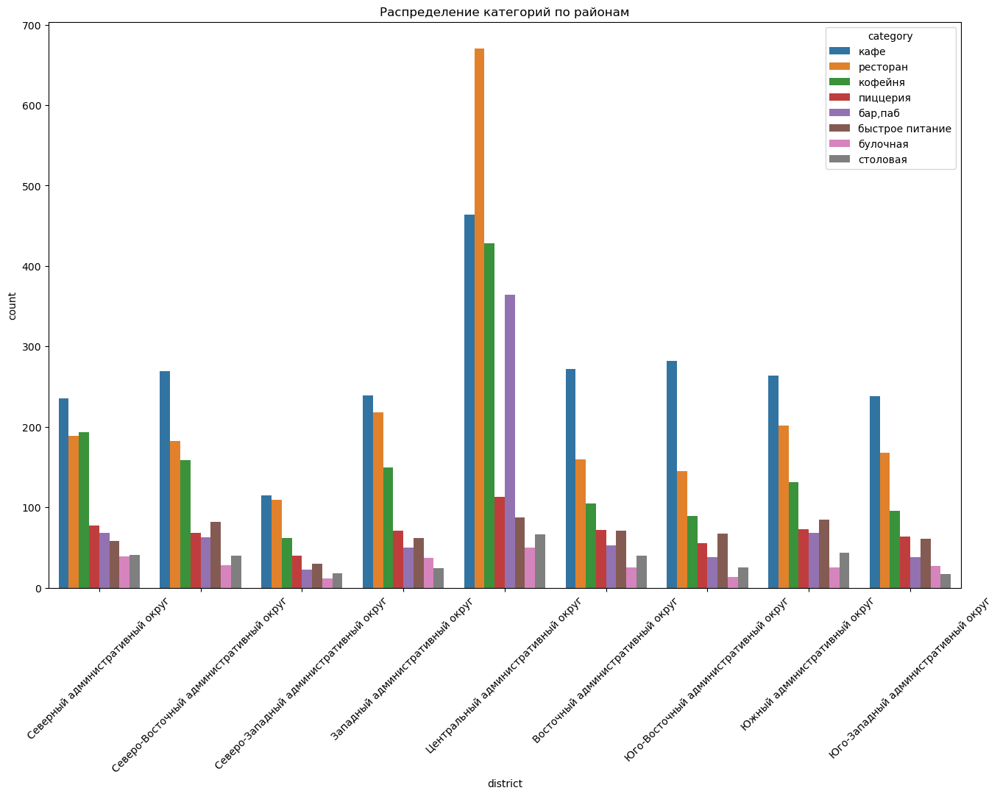

In [30]:
plt.figure(figsize=(16, 10))
sns.countplot(x='district', hue='category', data=data)
plt.xticks(rotation=45)
plt.title('Распределение категорий по районам')
plt.show()

* Всего районов предоставленных в датасете 9 их наименования: 'Северный административный округ','Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ' 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ';

### Визуализируем распределение средних рейтингов по категориям заведений.

In [31]:
rating = data.groupby('category').agg({'rating':'mean'}).sort_values(by='rating',ascending = False)
rating

,rating
category,
"бар,паб",4.387712
пиццерия,4.301264
ресторан,4.290357
кофейня,4.277282
булочная,4.268359
столовая,4.211429
кафе,4.123886
быстрое питание,4.050249


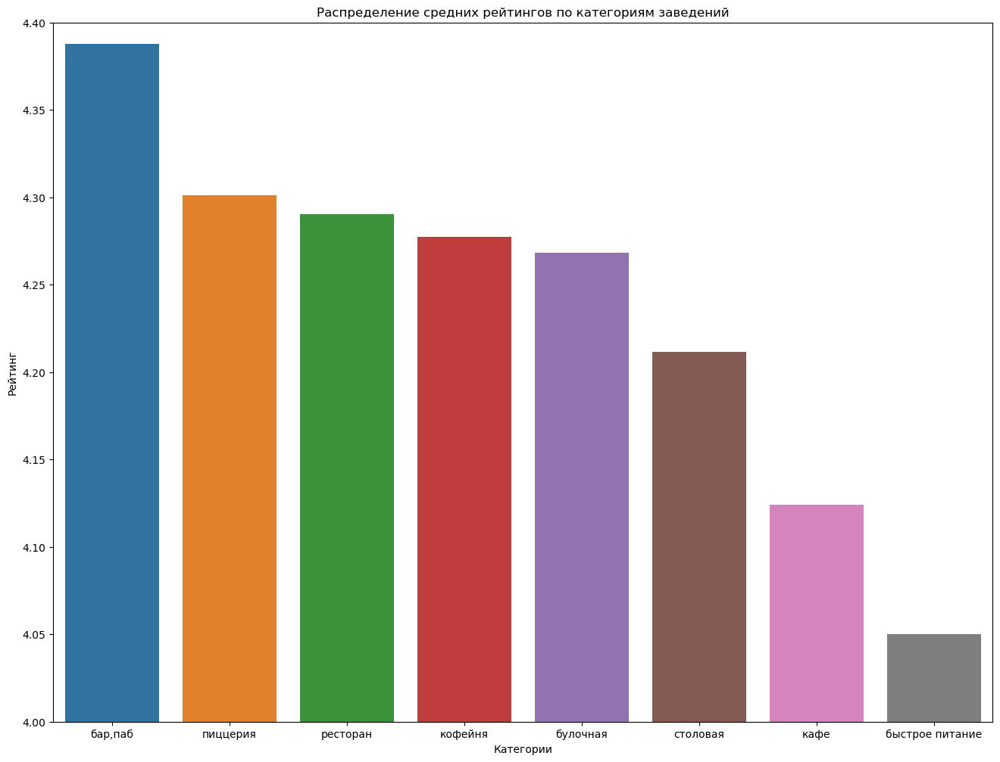

In [32]:
plt.figure(figsize=(16, 12))
# строим столбчатый график средствами seaborn
sns.barplot(x= rating.index, y='rating', data=rating)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категории')
plt.ylabel('Рейтинг')
plt.ylim(4, 4.4)
# отображаем график на экране
plt.show()

* Бар.паб лидирует по рейтингу среди посетителей, замыкает этот список Быстрое питание. При этом рейтинг отличается всего на 0.3 пункта;

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [33]:
with open('C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [34]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [35]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name', 
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m).geojson.add_child(folium.features.GeoJsonTooltip(['name',], labels=False))

# выводим карту
m

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [36]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Найдём топ-15 улиц по количеству заведений. 

In [37]:
top_15_street = data.groupby('street').agg({'name':'count'}).sort_values(by='name', ascending=False).head(15).reset_index()\
['street']
top_15_street

0      проспект Мира         
1      Профсоюзная улица     
2      проспект Вернадского  
3      Ленинский проспект    
4      Ленинградский проспект
5      Дмитровское шоссе     
6      Каширское шоссе       
7      Варшавское шоссе      
8      Ленинградское шоссе   
9      МКАД                  
10     Люблинская улица      
11     улица Вавилова        
12     Кутузовский проспект  
13     улица Миклухо-Маклая  
14     Пятницкая улица       
Name: street, dtype: object

In [38]:
top_15_street.unique()

array([' проспект Мира', ' Профсоюзная улица', ' проспект Вернадского',
       ' Ленинский проспект', ' Ленинградский проспект',
       ' Дмитровское шоссе', ' Каширское шоссе', ' Варшавское шоссе',
       ' Ленинградское шоссе', ' МКАД', ' Люблинская улица',
       ' улица Вавилова', ' Кутузовский проспект',
       ' улица Миклухо-Маклая', ' Пятницкая улица'], dtype=object)

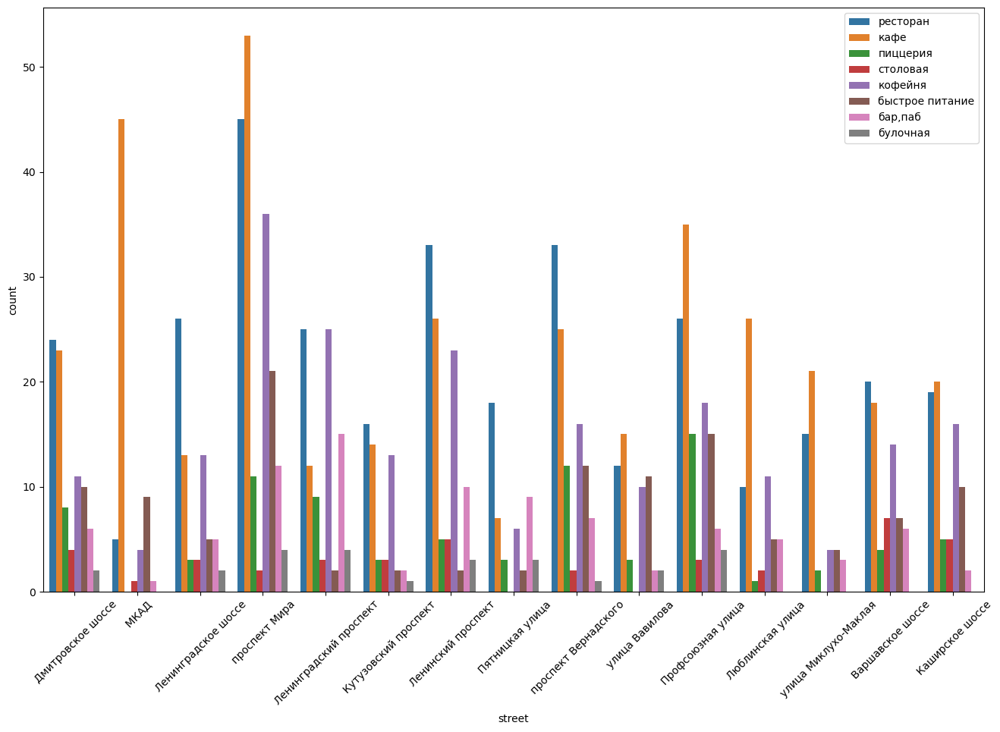

In [39]:
plt.figure(figsize=(16, 10))
sns.countplot(x='street', hue='category', data=data.query('street in @top_15_street'))
plt.xticks(rotation=45)
plt.legend(loc='upper right', fontsize=10)
plt.show()

* Топ-15 улиц по количеству заведений: ' проспект Мира', ' Профсоюзная улица', ' проспект Вернадского', ' Ленинский проспект', ' Ленинградский проспект', ' Дмитровское шоссе', ' Каширское шоссе', ' Варшавское шоссе', ' Ленинградское шоссе', ' МКАД',' Люблинская улица', ' улица Вавилова', ' Кутузовский проспект',' улица Миклухо-Маклая', ' Пятницкая улица'

### Найдем улицы, на которых находится только один объект общепита. 

In [40]:
one_places = data.groupby('street').agg({'name':'count'}).query('name == 1').reset_index()['street']
one_places

0       1-й Автозаводский проезд 
1       1-й Балтийский переулок  
2       1-й Варшавский проезд    
3       1-й Вешняковский проезд  
4       1-й Голутвинский переулок
                  ...            
453     улица Шкулёва            
454     улица Шкулёва 4          
455     улица Шухова             
456     улица Юннатов            
457     № 7                      
Name: street, Length: 458, dtype: object

In [41]:
data_one_place = data.query('street in @one_places')
data_one_place.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,name_chain
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False,несетевые заведения
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False,несетевые заведения
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,сетевые заведения
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False,сетевые заведения
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False,сетевые заведения


In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_one_place.apply(create_clusters, axis=1)

# выводим карту
m

In [43]:
data_one_place.groupby('category').agg({'name':'count'}).sort_values(by='name', ascending = False)

,name
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [44]:
data_one_place.groupby('category').agg({'rating':'mean'}).sort_values(by='rating', ascending = False)

,rating
category,
"бар,паб",4.479487
пиццерия,4.373333
булочная,4.337500
кофейня,4.307143
столовая,4.261111
ресторан,4.246237
кафе,4.133750
быстрое питание,4.082609


In [45]:
data_one_place.groupby('category').agg({'seats':'median'}).sort_values(by='seats', ascending = False)

,seats
category,
столовая,80.0
ресторан,55.0
"бар,паб",49.0
кафе,40.0
кофейня,40.0
пиццерия,38.0
быстрое питание,16.0
булочная,12.0


* Нашли 458 улиц где только 1 объект общепита. При этом рейтинг у заведений хороший, следовательно люди ходят туда не из-за безысходности;

### Построим фоновую картограмму (хороплет) среднего чека для каждого района.

In [46]:
middle_avg_bill_d = data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index()
middle_avg_bill_d

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [47]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_d,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m).geojson.add_child(folium.features.GeoJsonTooltip(['name',], labels=False))

# выводим карту
m

In [48]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

* Средний чек в заведениях Центрального АО и Западного АО ~ 1000 руб, т.о. в данном случае не зависит от удаленности от центра;
* Юго-Западный АО, Северо-Западный АО, Северный АО, Южный АО держат планку в ~ 600 -700 руб;
* Самый низкий средний чек в Юго-Восточном АО, Восточном АО и Северо-Восточном АО ~ 450 - 500 руб;

### Вывод:

* В датасете представленны категории заведений: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая';
* По количеству заведений лидируют Кафе замыкают этот список Булочная;
* Самое большое количество посадочных мест в Ресторанах, а минимальное в Булочных;
* Медианное количество посадочных мест по категорям находится в диаппазоне от 50 до 85;
* Несетевые зведения лидируют по количеству;
* Булочные, Пиццерии и Кофейни чаще являются сетевыми;
* В топ-15 заведений входят сети распространенные в России;
* Средний рейтинг топ-15 заведений варьируется от 3.87 до 4.46;
* В топ 15 заведений попали катогории: 'кофейня', 'пиццерия', 'ресторан', 'кафе', 'булочная';
* Всего районов предоставленных в датасете 9 их наименования: 'Северный административный округ','Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ' 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ';
* Бар.паб лидирует по рейтингу среди посетителей, замыкает этот список Быстрое питание. При этом рейтинг отличается всего на 0.3 пункта;
* Топ-15 улиц по количеству заведений: ' проспект Мира', ' Профсоюзная улица', ' проспект Вернадского', ' Ленинский проспект', ' Ленинградский проспект', ' Дмитровское шоссе', ' Каширское шоссе', ' Варшавское шоссе', ' Ленинградское шоссе', ' МКАД',' Люблинская улица', ' улица Вавилова', ' Кутузовский проспект',' улица Миклухо-Маклая', ' Пятницкая улица'
* В датасете 458 улиц где только 1 объект общепита. При этом рейтинг у заведений хороший, следовательно люди ходят туда не из-за безысходности;
* Средний чек в заведениях Центрального АО и Западного АО ~ 1000 руб, т.о. в данном случае не зависит от удаленности от центра;
* Юго-Западный АО, Северо-Западный АО, Северный АО, Южный АО держат планку в ~ 600 -700 руб;
* Самый низкий средний чек в Юго-Восточном АО, Восточном АО и Северо-Восточном АО ~ 450 - 500 руб;

## Детализируем исследование: открытие кофейни в Москве, такой же крутой и доступной, как «Central Perk»

Заказчикам, основателям фонда «Shut Up and Take My Money», не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Посмотрим сколько всего кофеен в датасете.

In [49]:
coffees = data.query('category == "кофейня"')
coffees.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,name_chain
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False,несетевые заведения
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,сетевые заведения
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False,сетевые заведения
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False,сетевые заведения
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False,сетевые заведения


In [50]:
coffees['name'].count()

1413

In [51]:
coffees['name'].nunique()

826

* В данных всего 1413 кофеен из них 826 с уникальными названиями;

### Взглянем в каких районах больше всего кофеен и каковы особенности их расположения

In [52]:
coffees_d = coffees.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)
coffees_d

,name
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [53]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffees_d,
    columns=[coffees_d.index, 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m).geojson.add_child(folium.features.GeoJsonTooltip(['name',], labels=False))

# выводим карту
m

In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffees.apply(create_clusters, axis=1)

# выводим карту
m

* В Центральном АО самое большое число кофеен, а в Северо-Западном АО наименьшее;

 ### Проверим есть ли круглосуточные кофейни

In [55]:
coffees.groupby('is_24/7').agg({'name':'count'})

,name
is_24/7,
False,1354
True,59


* Всего по Москве 59 круглосуточных кофеен;

### Посмотрим какие у кофеен рейтинги и как они распределяются по районам.

In [56]:
coffee_r = coffees.groupby('district').agg({'rating':'mean'}).sort_values(by='rating', ascending = False)
coffee_r

,rating
district,
Центральный административный округ,4.336449
Северо-Западный административный округ,4.325806
Северный административный округ,4.291710
Юго-Западный административный округ,4.283333
Восточный административный округ,4.282857
Южный административный округ,4.232824
Юго-Восточный административный округ,4.225843
Северо-Восточный административный округ,4.216981
Западный административный округ,4.195333


In [57]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=coffee_r,
    columns=[coffee_r.index, 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m).geojson.add_child(folium.features.GeoJsonTooltip(['name'], labels=True))

# выводим карту
m

* Самые высокие рейтинги в Центральном АО, а самые низкие в Западном АО;

### Посчитаем на какую стоимость чашки капучино стоит ориентироваться при открытии

In [58]:
coffees['middle_coffee_cup'].median()

170.0

In [59]:
coffee_mcc = coffees.groupby('district').agg({'middle_coffee_cup':'median'}).sort_values(by='middle_coffee_cup', ascending = False)
coffee_mcc

,middle_coffee_cup
district,
Юго-Западный административный округ,198.0
Центральный административный округ,190.0
Западный административный округ,189.0
Северо-Западный административный округ,165.0
Северо-Восточный административный округ,162.5
Северный административный округ,159.0
Южный административный округ,150.0
Юго-Восточный административный округ,147.5
Восточный административный округ,135.0


In [60]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\StudentYandex\\Projekts\\Python\\Projekt9history\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=coffee_mcc,
    columns=[coffee_mcc.index, 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m).geojson.add_child(folium.features.GeoJsonTooltip(['name',], labels=False))

# выводим карту
m

* Стоит ориентироваться на медианную стоимость чашки кофе по Москве, т.е. 175 руб. для создания конкуренции среди развитых сетей;

## Презентация:

https://disk.yandex.ru/i/9FpIpTlU8--CNA

## Общий вывод

**Мы провели исследование заведений общественного питания города Москвы, такие выводы получили:**

* в датасете предоставленна информация о 8406 заведениях, из них 5614 с уникальными названиями, 714 с двумя и более заведениями;
* В датасете отсутсвуют явные дубликаты, это радует;
* К сожалению есть большое количество пропусков, и не представляется возможным их удалить или заполнить. Хотели заполнить столбец price в соответствии со столбцом avg_bill, но видим что дельта среднего чека пересекается, следовательно заполнить категорию по среднему чеку будет не правильно - это исказит данные, например:

`выше среднего Средний счёт:1500–1600 ₽` и `высокие	Средний счёт:1500–2000 ₽`

* Пропуски в столбцах middle_avg_bill, middle_coffee_cup так же оставляем, т.к. они заполняются данными из avg_bill;
* Пропущенные значения в hours и seats не можем заполнить, т.к. каждое кафе работает по своему распорядку времени и даже внутри одной сети рабочие дни, часы работы и количество посадочных мест может разнится;
* Пропуски в данных появились т.к. данные взяты из общедоступных источников следовательно тут сыграл человеческий фактор, там где можно было не заполнять - не заполняли;
* Все наименования привели к нижнему регистру для минимизации дубликатов - это нам позволило выявить еще 38 сетевых заведений;
* Добавили два новых столбца street с названием улицы и is_24/7 с логическим значением True, если заведение работает ежедневно и круглосуточно и False в противном случае;
* В датасете представленны категории заведений: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая';
* По количеству заведений лидируют Кафе замыкают этот список Булочная;
* Самое большое количество посадочных мест в Ресторанах, а минимальное в Булочных;
* Медианное количество посадочных мест по категорям находится в диаппазоне от 50 до 85;
* Несетевые зведения лидируют по количеству;
* Булочные, Пиццерии и Кофейни чаще являются сетевыми;
* В топ-15 заведений входят сети распространенные в России;
* Средний рейтинг топ-15 заведений варьируется от 3.87 до 4.46;
* В топ 15 заведений попали катогории: 'кофейня', 'пиццерия', 'ресторан', 'кафе', 'булочная';
* Всего районов предоставленных в датасете 9 их наименования: 'Северный административный округ','Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ' 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ';
* Бар.паб лидирует по рейтингу среди посетителей, замыкает этот список Быстрое питание. При этом рейтинг отличается всего на 0.3 пункта;
* Топ-15 улиц по количеству заведений: ' проспект Мира', ' Профсоюзная улица', ' проспект Вернадского', ' Ленинский проспект', ' Ленинградский проспект', ' Дмитровское шоссе', ' Каширское шоссе', ' Варшавское шоссе', ' Ленинградское шоссе', ' МКАД',' Люблинская улица', ' улица Вавилова', ' Кутузовский проспект',' улица Миклухо-Маклая', ' Пятницкая улица'
* В датасете 458 улиц где только 1 объект общепита. При этом рейтинг у заведений хороший, следовательно люди ходят туда не из-за безысходности;
* Средний чек в заведениях Центрального АО и Западного АО ~ 1000 руб, т.о. в данном случае не зависит от удаленности от центра;
* Юго-Западный АО, Северо-Западный АО, Северный АО, Южный АО держат планку в ~ 600 -700 руб;
* Самый низкий средний чек в Юго-Восточном АО, Восточном АО и Северо-Восточном АО ~ 450 - 500 руб;

**Рекомендации:**
* Самые распространенные виды заведений: кафе, ресторан и кофейни. По всей видимости, они пользуются наибольшим спросом. Поэтому открыть кофейню - не плохая идея;
* в Москве нет улицы, которая бы отличалась определённым видом заведений. Однако, самая популярная улица - Проект Мира;
* лучше всего открывать кофейню в Юго-Восточном АО, так как там не так много кофеен и рейтинг этих кофеен не достаточно высокий по отношению к другим районам города;
* В Центральном АО открывать кофеню не рекомендуется из-за повышенной конкуренции и высокого рейтинга заведений;
* средняя цена на чашку капучино должна состалять  ~ 175 рублей;
* кофейня не обязательно должна быть круглосуточной и сетевой.